# Detection: Test Your Model on Images Showing Objects in Background

### Pipeline
1. Load & display images
2. Extract ORB keypoints/descriptors
3. Visualise **all** raw keypoints (red)
4. Apply NMS
5. Visualise **retained** keypoints (green)
6. Save the NMS‑pruned descriptors (`.npy`) and keypoint metadata (`.csv`)

**Dependencies**: `opencv-python`, `numpy`, `matplotlib`.

In [12]:
# import modules
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

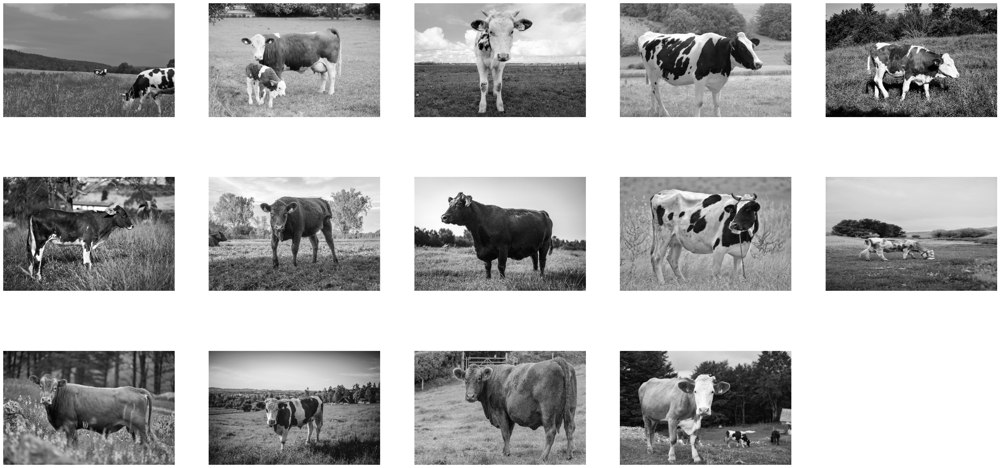

In [13]:
# 1. Load & display images
bg_and_cow_features_path = "features/bg_and_cow_features/"
file_names = os.listdir('images/cows_and_bgs')
cow_and_bg_imgs = [cv.imread(f'images/cows_and_bgs/{file_name}', cv.IMREAD_GRAYSCALE) for file_name in file_names]
cow_and_bg_imgs = [cv.resize(img, (600, 400)) for img in cow_and_bg_imgs]

def showImages(imgs, rows=1, cols=10, cmap="gray"):
    fig = plt.figure(figsize=(40, 20))
    for i, img in enumerate(imgs, 1):
        fig.add_subplot(rows, cols, i)
        plt.imshow(img, cmap=cmap)
        plt.axis("off")
    plt.show()

showImages(cow_and_bg_imgs, rows=3, cols=5)        

In [14]:
# 2. Extract keypoints/descriptors
sift = cv.ORB_create(nfeatures=1000) # nfeatures=1000
kp_dsp = [sift.detectAndCompute(cow_img, None) for cow_img in cow_and_bg_imgs] # keypoints & descriptors
keypoints = [kp[0] for kp in kp_dsp]
descriptors = [kp[1] for kp in kp_dsp]

print([len(kp_data) for kp_data in keypoints])

[941, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 996, 1000]


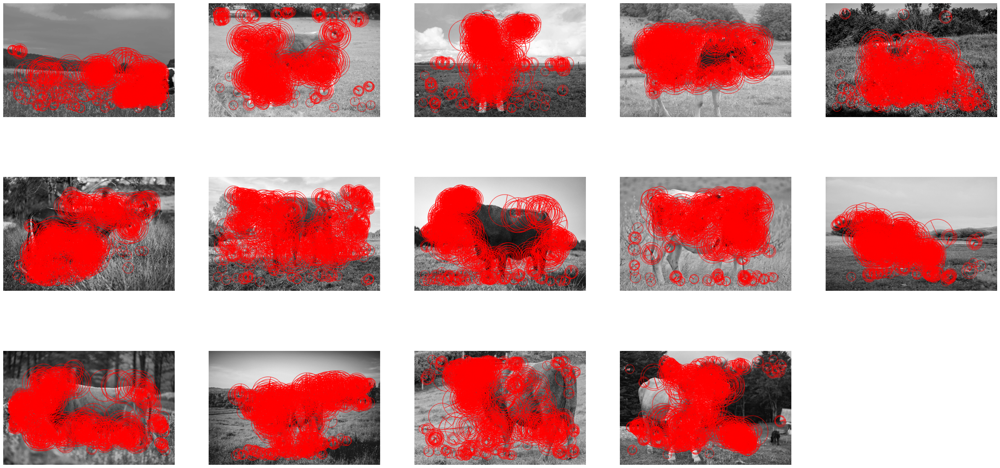

In [15]:
# 3. Visualise all raw keypoints
keypoint_imgs = [cv.drawKeypoints(img, keypoint, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255, 0, 0)) for img, keypoint in zip(cow_and_bg_imgs, keypoints)]
showImages(keypoint_imgs, rows=3, cols=5)

In [16]:
# 4. Apply NMS

euclidian = lambda kp1, kp2: np.sqrt(((kp1.pt[0] - kp2.pt[0]) ** 2) + ((kp1.pt[1] - kp2.pt[1]) ** 2))

def applyNMS(keypoints, descriptors):

  all_keypoints = []
  all_descriptors = []

  # iterate over every image
  for kp_data, dp_data in zip(keypoints, descriptors):

    # iterate over every single keypoint
    sorted_responses = np.argsort([kp.response for kp in kp_data])
    sorted_kp_np = np.array(kp_data)[sorted_responses]
    sorted_dp_np = np.array(dp_data)[sorted_responses]

    cleaned_keypoints = []
    cleaned_descriptors = []

    sorted_kp = sorted_kp_np.tolist()
    sorted_dp = sorted_dp_np.tolist()

    while sorted_kp:

      fixed_kp = sorted_kp.pop(0)
      fixed_dp = sorted_dp.pop(0)
      threshold = fixed_kp.size / 2

      cleaned_keypoints.append(fixed_kp)
      cleaned_descriptors.append(fixed_dp)

      indices_to_delete = []

      for i, curr_kp in enumerate(sorted_kp):
        distance = euclidian(fixed_kp, curr_kp)

        # print(distance, threshold)
        if distance < threshold:
          indices_to_delete.append(i)

      # delete keypoints which are too close
      for i in sorted(indices_to_delete, reverse=True):
        sorted_kp.pop(i)
        sorted_dp.pop(i)

    all_keypoints.append(cleaned_keypoints)
    all_descriptors.append(cleaned_descriptors)

  return all_keypoints, all_descriptors

keypoints_nms, descriptors_nms = applyNMS(keypoints, descriptors)

kp_len = [len(kp_data) for kp_data in keypoints_nms]
dp_len = [len(dp_data) for dp_data in descriptors_nms]
assert kp_len == dp_len
print(kp_len)

[36, 49, 47, 53, 58, 46, 56, 46, 68, 33, 35, 44, 58, 53]


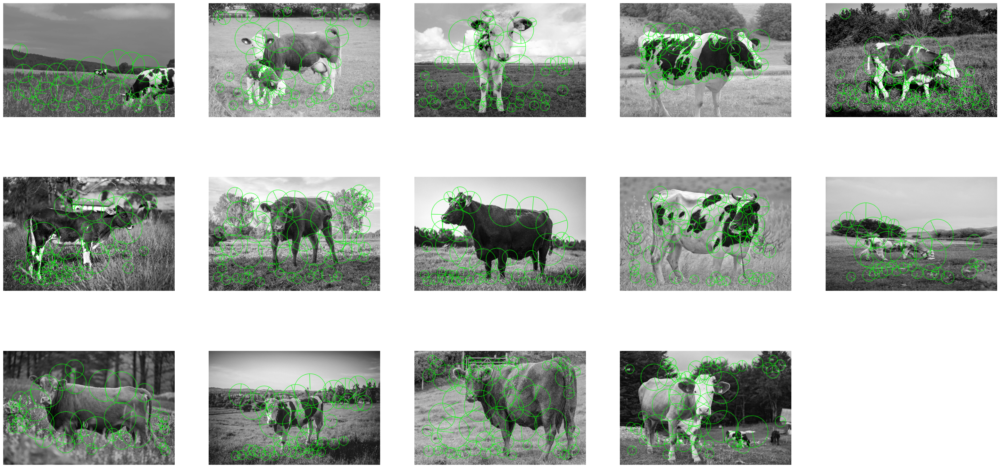

In [17]:
# 5. Visualise retained keypoints
cow_and_bg_imgs_nms = [cv.drawKeypoints(img, kp_data, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0, 255, 0)) for img, kp_data in zip(cow_and_bg_imgs, keypoints_nms)]
showImages(cow_and_bg_imgs_nms, rows=3, cols=5)

In [18]:
# 6. Save the NMS‑pruned descriptors and keypoint metadata
def saveNMSData(path, keypoints, descriptors):
    # transform keypoints into numpy array
    transformed = []
    
    for kp_data in keypoints:
        sub = [[kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id] for kp in kp_data]
        transformed.append(sub)

    np.save(f"{path}keypoints_nms.npz", np.array(transformed, dtype=object))
    np.save(f"{path}descriptors_nms.npz", np.array(descriptors, dtype=object))
    print("NMS Keypoints and Descriptors successfully saved.")

def loadNMSData(path):

    temp = np.load(f"{path}keypoints_nms.npz.npy", allow_pickle=True)
    descriptors_nms = np.load(f"{path}descriptors_nms.npz.npy", allow_pickle=True)
    keypoints_nms = []

    for tmp in temp:
        kp_data = [cv.KeyPoint(
            x=kp[0][0], 
            y=kp[0][1], 
            size=kp[1], 
            angle=kp[2],
            response=kp[3],
            octave=kp[4],
            class_id=kp[5]
        ) for kp in tmp]
        keypoints_nms.append(kp_data)

    print("NMS Keypoints and Descriptors successfully loaded.")
    return keypoints_nms, descriptors_nms

saveNMSData(bg_and_cow_features_path, keypoints_nms, descriptors_nms)

NMS Keypoints and Descriptors successfully saved.


## Load object & background cluster models
Load model data:
- **Object** clusters: `orb_allfeatures_cow/cluster_centers.npy` and their displacement lists `cluster_displacements.json`.
- **Background** clusters: `orb_allfeatures_background_images/cluster_centers.npy`.

Executed once before processing test images.

In [19]:
# 16. Load object & background cluster models
import json

def loadClustersAndDPVS(path):

    per_image_labels = np.load(f"{path}image_labels.npz.npy", allow_pickle=True)
    cluster_centers = np.load(f"{path}cluster_centers.npz.npy", allow_pickle=True)
    dpvs = np.load(f"{path}dpvs.npz.npy", allow_pickle=True)
    print("Sucessfully loaded clustering and displacement-vector data.")

    return per_image_labels, cluster_centers, dpvs

def loadEnrichedData(path):

    total_data = len(os.listdir(f"{path}enriched_data"))
    enriched_data = [np.load(f"{path}enriched_data/data_{i}.npz.npy", allow_pickle=True).tolist() for i in range(total_data)]

    with open(f"{path}cluster_displacements.json") as f:
        data = json.load(f).values()
        cluster_displacements = [dpvs for dpvs in data]

    return enriched_data, cluster_displacements

cow_features_path = "features/cow_features/"
bg_features_path = "features/bg_features/"

obj_per_image_labels, obj_cluster_centers, obj_dpvs = loadClustersAndDPVS(cow_features_path)
bg_per_image_labels, bg_cluster_centers, bg_dpvs = loadClustersAndDPVS(bg_features_path)

obj_enriched_data, obj_cluster_displacements = loadEnrichedData(cow_features_path)
bg_enriched_data, bg_cluster_displacements = loadEnrichedData(bg_features_path)

print(len(obj_enriched_data))
print(f"Loaded {len(obj_cluster_centers)} cow and {len(bg_cluster_centers)} background clusters.")

Sucessfully loaded clustering and displacement-vector data.
Sucessfully loaded clustering and displacement-vector data.
15
Loaded 16 cow and 27 background clusters.


## Assign test keypoint feature descriptors to nearest cluster (codebook entry / visual word) and keep object keypoints only

In [20]:
# 17. Assign test keypoint feature descriptorss to nearest cluster (codebook entry / visual word) and keep object keypoints only

filtered_keypoints = []
filtered_descriptors = []
filtered_per_image_labels = []
for kp_data, dp_data in zip(keypoints_nms, descriptors_nms):

    new_keypoints = []
    new_descriptors = []
    new_labels = []
    for kp, dp in zip(kp_data, dp_data):

        dp_arr = np.array(dp)
        obj_all_dist = [np.linalg.norm(dp - cc) for cc in obj_cluster_centers]
        bg_all_dist = [np.linalg.norm(dp - cc) for cc in bg_cluster_centers]

        if np.min(obj_all_dist) < np.min(bg_all_dist):
            new_keypoints.append(kp)
            new_descriptors.append(dp)
            new_labels.append(np.argmin(obj_all_dist))
    
    filtered_keypoints.append(new_keypoints)
    filtered_descriptors.append(new_descriptors)
    filtered_per_image_labels.append(new_labels)

kp_len = [len(kp_data) for kp_data in filtered_keypoints]
dp_len = [len(kp_data) for kp_data in filtered_descriptors]
labels_len = [len(labels) for labels in filtered_per_image_labels]
assert kp_len == dp_len == labels_len
print(kp_len)

[12, 14, 15, 25, 24, 18, 26, 23, 34, 8, 16, 15, 26, 17]


## Voting procedure

Visualise object votes (displacement vectors from cluster). 

Here it is done on the test images and not on the training images only. So this is the application of the Implicit Shape Model to real data.

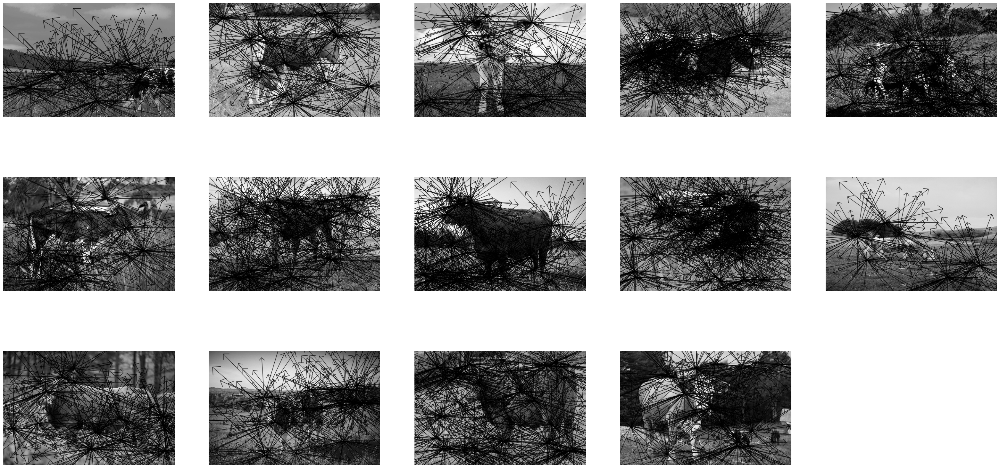

In [21]:
# 18. Visualise object votes (same as in training jupyter notebook)
def plot_dense_voting_field(imgs, keypoints, labels, cluster_displacements, rows=3, cols=5):

    for img, kp_data, cluster_labels in zip(imgs, keypoints, labels):
        for kp, label in zip(kp_data, cluster_labels):

            pt1 = tuple(map(int, kp.pt))
            pt1_arr = np.array(kp.pt)
            dpvs = cluster_displacements[label] # visual word
            
            for dpv in dpvs:
                pt2 = pt1_arr + dpv 
                pt2 = tuple(map(int, pt2))
                cv.arrowedLine(img, pt1, pt2, (0, 0, 255), 1, cv.LINE_AA)
                
    showImages(imgs, rows=rows, cols=cols)

plot_dense_voting_field(cow_and_bg_imgs, filtered_keypoints, filtered_per_image_labels, obj_cluster_displacements)

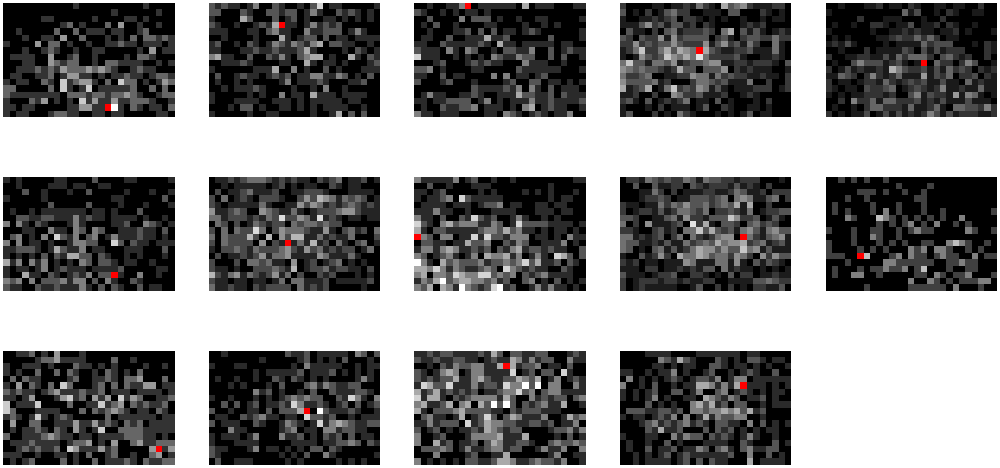

In [22]:
# 19. Cast votes to low resolution grid bins and visualize (same as in training jupyter notebook)

def applyVotingProcedure(imgs, keypoints, labels, cluster_displacements, bins_size=20):

    all_voting_grids = []
    final_imgs = []
    for img, kp_data, img_labels in zip(imgs, keypoints, labels):

        h, w = img.shape
        n, v = h // bins_size, w // bins_size
        voting_grid = np.zeros((n, v))
        
        # q, r = n*block_size, v*block_size
        # print(w, h, " - ", n, v, " - ", q, r)
        for kp, label in zip(kp_data, img_labels):

            dpvs = cluster_displacements[label]
            pt = np.array(kp.pt)

            for dpv in dpvs:
                
                vec = pt + dpv
                i = int(vec[1] / bins_size)
                j = int(vec[0] / bins_size)

                if 0 <= i < n and 0 <= j < v:
                    voting_grid[i, j] += 1

        all_voting_grids.append(voting_grid)
        max_pos = np.argmax(voting_grid)
        i, j = np.unravel_index(max_pos, voting_grid.shape)
        # create grid image based on voting
        norm_grid = cv.normalize(voting_grid, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
        norm_grid_color = cv.cvtColor(norm_grid, cv.COLOR_GRAY2BGR)
        norm_grid_color[i, j] = (255, 0, 0)
        # print(norm_grid)
        final_imgs.append(norm_grid_color)

    return all_voting_grids, final_imgs

all_voting_grids, final_imgs = applyVotingProcedure(cow_and_bg_imgs, filtered_keypoints, filtered_per_image_labels, obj_cluster_displacements, bins_size=22)
# showImages(cow_imgs_nms, rows=3, cols=5)
showImages(final_imgs, rows=3, cols=5)

# Discussion

Discuss the achievements of you **prototype** Implicit Shape Model:

- Are the result reasonable in principle?
- What are the deficits?
- Suggest improvements:
    - Does your approach make use of an angle or a direction of the keypoint?
    - If not, what would you need to change?
    - Does your approach make use of a size or scale of the keypoint?
    - If not, what would you need to change?
    - What are the implications concerning rotations or size/scale changes of your images?
    - Can you reduce the complexity of your task by providing other training and test data?
    
If you have the time, try to realize some of the suggested improvements.

# Discussion

Discuss the achievements of you **prototype** Implicit Shape Model:

- Are the result reasonable in principle?
    - We think the results are reasonable as the general direction and voting schemes seem to align with the example provided.
- What are the deficits?
    - The test-images we used, especially for inference, have a lot of noise.
    - We only have limited training data, so the results are not perfect.
    - The voting results point generally in the correct direction but are not ideal.
    - Performance drops when a cow is near the image border or when the background has many detected keypoints.
- Suggest improvements:
    - Does your approach make use of an angle or a direction of the keypoint?
        - We do not use angle or direction. We use only displacement vectors
    - If not, what would you need to change?
        - We are not so sure
    - Does your approach make use of a size or scale of the keypoint?
        - We use the size in our NMS filtering.
        - We thought about using `KeyPoint.overlap` 
    - If not, what would you need to change?
        - N/A
    - What are the implications concerning rotations or size/scale changes of your images?
        - Rotation of the image (e.g. cow standing on its head) would likely cause the learned displacement vectors to point in the wrong direction.

    - Can you reduce the complexity of your task by providing other training and test data?
        - If we could find a coreset of perfect representations we could optimize the results
    
If you have the time, try to realize some of the suggested improvements.